In [73]:
import numpy as np
import pandas as pd
import seaborn as sns, numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.stats import ttest_ind

## Exploring the data

In [13]:
train = pd.read_csv('train.csv')
train.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [14]:
train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

### Object versus numerical columns

In [44]:
train.select_dtypes(include=['int', 'float']).head(10)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,...,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,...,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,...,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,...,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,...,0,4,0,0,0,0,0,1,2008,118000


In [102]:
train.select_dtypes(include=['object']).head(10)


,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
5,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,...,Attchd,Unf,TA,TA,Y,NaN,MnPrv,Shed,WD,Normal
6,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
7,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,...,Attchd,RFn,TA,TA,Y,NaN,NaN,Shed,WD,Normal
8,RM,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,...,Detchd,Unf,Fa,TA,Y,NaN,NaN,NaN,WD,Abnorml
9,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,...,Attchd,RFn,Gd,TA,Y,NaN,NaN,NaN,WD,Normal


In [104]:
col_object = train.select_dtypes(include=['object']).columns
col_object

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

### Dropping columns with > 1100 NAs

In [34]:
len(train) # 1460
null_column = train.isna().sum()
null_column[null_column > 0]


LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [37]:
drop_cols = list(null_column[null_column > 1100].index)
train2 = train.drop(drop_cols, axis=1)

null_column = train2.isna().sum()
null_column[null_column > 0]

LotFrontage     259
MasVnrType        8
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
FireplaceQu     690
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64

### Distribution of SalePrice

Mean of SalePrice:  180921.19589041095
count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


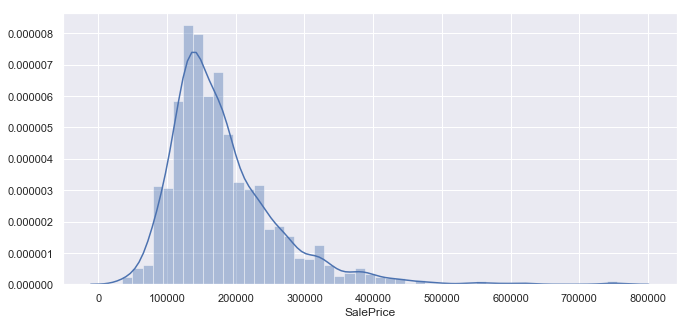

In [263]:
print('Mean of SalePrice: ',train2['SalePrice'].mean())
print(train2['SalePrice'].describe())

ax = sns.distplot(train['SalePrice'])

### Relationship between SalePrice and LotConfig

In [58]:
# mean of SalePrice by LotConfig
train2.groupby('LotConfig', as_index=False).agg({'SalePrice':'mean'})


,LotConfig,SalePrice
0,Corner,181623.425856
1,CulDSac,223854.617021
2,FR2,177934.574468
3,FR3,208475.000000
4,Inside,176938.047529


Text(0, 0.5, 'Density')

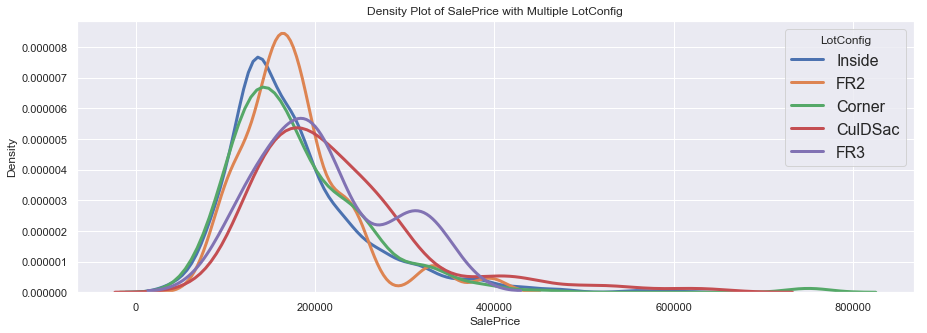

In [90]:
# List of five LotConfig to plot
conf_list = ['Inside', 'FR2', 'Corner', 'CulDSac', 'FR3']

# Iterate through the five LotConfig
for conf in conf_list:
    # Subset to the config
    subset = train2[train2['LotConfig'] == conf]
    
    # Draw the density plot
    sns.distplot(subset['SalePrice'], hist = False, kde = True,
                 kde_kws = {'linewidth': 3},
                 label = conf)
    
# Plot formatting
plt.rcParams["figure.figsize"] = (11,5)
plt.legend(prop={'size': 16}, title = 'LotConfig')
plt.title('Density Plot of SalePrice with Multiple LotConfig')
plt.xlabel('SalePrice')
plt.ylabel('Density')

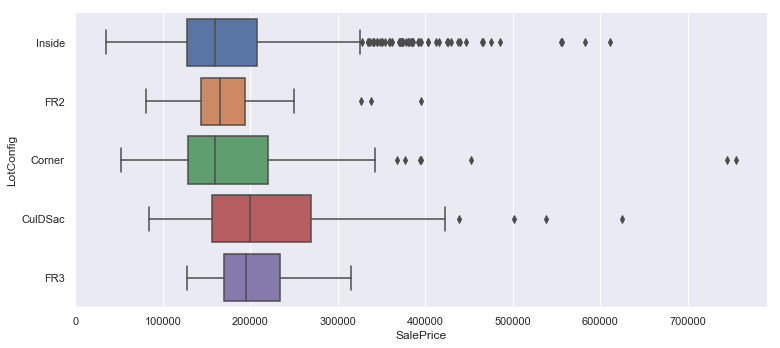

In [92]:
sns.catplot(x="SalePrice",y="LotConfig",kind='box',data=train2, aspect=11/5)


In [71]:
# Comparing several means (ANOVA)

model = ols('SalePrice ~ C(LotConfig)', data=train2).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table


,sum_sq,df,F,PR(>F)
C(LotConfig),1.935444e+11,4.0,7.809954,0.000003
Residual,9.014367e+12,1455.0,NaN,NaN


ANOVA results suggest that the LotConfig shows significant different SalePrice mean values

In [85]:
# List of five LotConfig to plot
conf_list = ['Inside', 'FR2', 'Corner', 'CulDSac', 'FR3']

for var in conf_list:
    FR2 = train2[train2['LotConfig']== var]
    others = train2[train2['LotConfig']!= var]
    tstat, pval = ttest_ind(FR2['SalePrice'], others['SalePrice'], equal_var=False)
    print(var, pval)
    if pval <= 0.05:
        print('reject H0, significant difference from the other configs \n')
    else:
        print('no significant difference from the other configs \n')


Inside 0.0035113089217790744
reject H0, significant difference from the other configs 

FR2 0.7440951688347446
no significant difference from the other configs 

Corner 0.8802029481855341
no significant difference from the other configs 

CulDSac 9.288185492655419e-06
reject H0, significant difference from the other configs 

FR3 0.5318809033229664
no significant difference from the other configs 



It seems a house Inside or in a CulDSac would show a significant lower (resp. higher) Sale Price than other configs.

### Same analysis for LotShape

In [93]:
#mean of SalePrice by LotShape
train2.groupby('LotShape', as_index=False).agg({'SalePrice':'mean'})


,LotShape,SalePrice
0,IR1,206101.665289
1,IR2,239833.365854
2,IR3,216036.500000
3,Reg,164754.818378


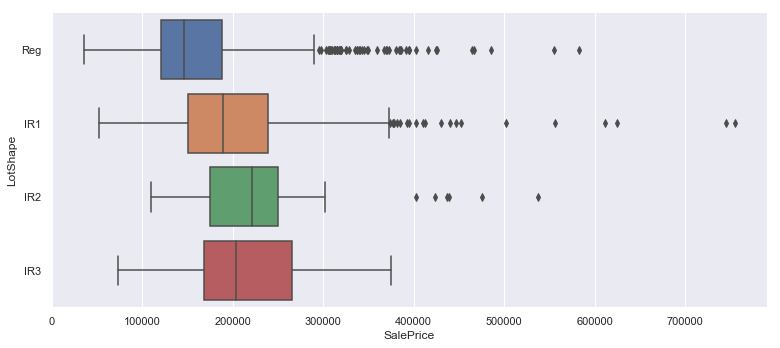

In [95]:
sns.catplot(x="SalePrice",y="LotShape",kind='box',data=train2, aspect=11/5)


In [96]:
# Comparing several means (ANOVA)

model = ols('SalePrice ~ C(LotShape)', data=train2).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(LotShape),7.032607e+11,3.0,40.132852,6.447524e-25
Residual,8.504651e+12,1456.0,NaN,NaN


ANOVA results suggest that the LotShape shows significant different SalePrice mean values

In [100]:
# List of four LotShape 
shape_list = train2.LotShape.unique()

for shape in shape_list:
    s = train2[train2['LotShape']== shape]
    others = train2[train2['LotShape']!= shape]
    tstat, pval = ttest_ind(s['SalePrice'], others['SalePrice'], equal_var=False)
    print(shape, pval)
    if pval <= 0.05:
        print('reject H0, significant difference from the other shapes \n')
    else:
        print('no significant difference from the other shapes \n')


Reg 2.0075746340919894e-22
reject H0, significant difference from the other shapes 

IR1 4.754497586912746e-16
reject H0, significant difference from the other shapes 

IR2 0.00039010495203168515
reject H0, significant difference from the other shapes 

IR3 0.2094859636557417
no significant difference from the other shapes 



The following ANOVA would test both LotShape and LotConfig effects on SalePrice

In [127]:

model = ols('SalePrice ~ C(LotShape) + C(LotConfig)', data=train2).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table


,sum_sq,df,F,PR(>F)
C(LotShape),5.366329e+11,3.0,30.636760,3.336654e-19
C(LotConfig),2.691657e+10,4.0,1.152515,3.301717e-01
Residual,8.477734e+12,1452.0,NaN,NaN


Both LotShape and LotConfig have an influence on SalePrice

## Determine whether a categorical variable have an impact on SalePrice value. 


In [109]:
col_object = train2.select_dtypes(include=['object']).columns
col_object

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

### The following ANOVA will test one by one all categorical variables

In [158]:
factor_col_significant = []
factor_col_not_significant = []

for col in col_object:
    model = ols('SalePrice ~C('+col+')', data=train2).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    if anova_table['PR(>F)'][0] <= 0.05:
        factor_col_significant.append(col)
    else:
        factor_col_not_significant.append(col)
        
print('Categorical variables that influence significantly SalePrice: \n \n', factor_col_significant)
print('\n Categorical variables that do NOT influence significantly SalePrice: \n \n', factor_col_not_significant)



Categorical variables that influence significantly SalePrice: 
 
 ['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']

 Categorical variables that do NOT influence significantly SalePrice: 
 
 ['Street', 'Utilities', 'LandSlope']


Here, only 3 variables do not impact SalePrice

### The following ANOVA will test all categorical variables all at once

In [134]:
' + '.join(['C('+col+')' for col in col_object])


'C(MSZoning) + C(Street) + C(LotShape) + C(LandContour) + C(Utilities) + C(LotConfig) + C(LandSlope) + C(Neighborhood) + C(Condition1) + C(Condition2) + C(BldgType) + C(HouseStyle) + C(RoofStyle) + C(RoofMatl) + C(Exterior1st) + C(Exterior2nd) + C(MasVnrType) + C(ExterQual) + C(ExterCond) + C(Foundation) + C(BsmtQual) + C(BsmtCond) + C(BsmtExposure) + C(BsmtFinType1) + C(BsmtFinType2) + C(Heating) + C(HeatingQC) + C(CentralAir) + C(Electrical) + C(KitchenQual) + C(Functional) + C(FireplaceQu) + C(GarageType) + C(GarageFinish) + C(GarageQual) + C(GarageCond) + C(PavedDrive) + C(SaleType) + C(SaleCondition)'

In [255]:
import warnings
warnings.filterwarnings("ignore") # this allows to ignore warnings



model = ols('SalePrice ~'+ ' + '.join(['C('+col+')' for col in col_object]), data=train2).fit()
anova_table = sm.stats.anova_lm(model, typ=2)



anova_table['variable'] = anova_table.index
anova_table['variable'] = anova_table.variable.str.strip("C").str.replace("[()]", "")
anova_table.head()

,sum_sq,df,F,PR(>F),variable
C(MSZoning),6.157608e+09,4.0,0.953324,0.414477,MSZoning
C(Street),2.596386e+09,1.0,1.607895,0.205307,Street
C(LotShape),5.999896e+09,3.0,1.238542,0.294917,LotShape
C(LandContour),6.591792e+09,3.0,1.360726,0.253883,LandContour
C(Utilities),2.663451e+09,1.0,1.649427,0.199561,Utilities


In [290]:

anova2_significant = []
anova2_not_significant = []
for index, row in anova_table.iterrows():
    if row['PR(>F)'] <= 0.05:
        anova2_significant.append(row['variable'])
    else:
        anova2_not_significant.append(row['variable'])
            
print('\n Categorical variables that influence significantly SalePrice if analyzed all at once: \n \n', anova2_significant)
print('\n', len(anova2_significant), ' variables')

print('\n Categorical variables that do NOT influence significantly SalePrice when taken altogether: \n \n', anova2_not_significant)
print('\n', len(anova2_not_significant), ' variables')



 Categorical variables that influence significantly SalePrice if analyzed all at once: 
 
 ['LotConfig', 'Neighborhood', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'KitchenQual', 'SaleType', 'SaleCondition']

 14  variables

 Categorical variables that do NOT influence significantly SalePrice when taken altogether: 
 
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LandSlope', 'Condition1', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtCond', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'Residual']

 26  variables


In [238]:
print(factor_col_significant == anova2_significant)
print(factor_col_not_significant == anova2_not_significant)


False
False


When analyzed altogether, there are more variables that do not impact SalePrice (eg. MSZoning is no more in significant categorical variables list in multiple ANOVA). Multiways ANOVA limits redundancy in data information.

#### These categorical variables seem to have an influence on SalePrice :

#### 'LotConfig', 'Neighborhood', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'KitchenQual', 'SaleType', 'SaleCondition'




### This cell iterates through all the significant categorical variables and plot the SalePrice


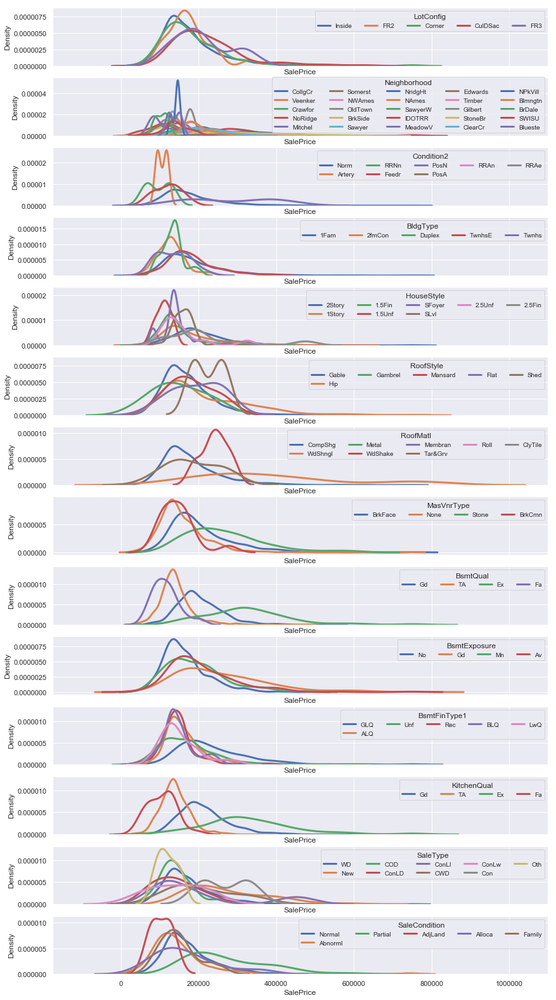

In [286]:
# Iterate through the significant categorical variables:

n=len(anova2_significant)
fig,ax = plt.subplots(n,1, figsize=(14,n*2), sharex=True)
i=0

for var in anova2_significant:
    
    # Subset to the config
    subcategory = train2[var].unique()
    plt.sca(ax[i])
    for sub in subcategory:
        subset = train2[train2[var] == sub]

        # Draw the density plot
        
        ax[i] = sns.distplot(subset['SalePrice'], hist = False, kde = True,
                     kde_kws = {'linewidth': 3},
                 label = sub)
    
    # Plot formatting
    plt.legend(prop={'size': 10}, title = var, ncol=5)
    #plt.title('Density Plot of SalePrice')
    plt.xlabel('SalePrice')
    plt.ylabel('Density')
                    
                    
    i+=1


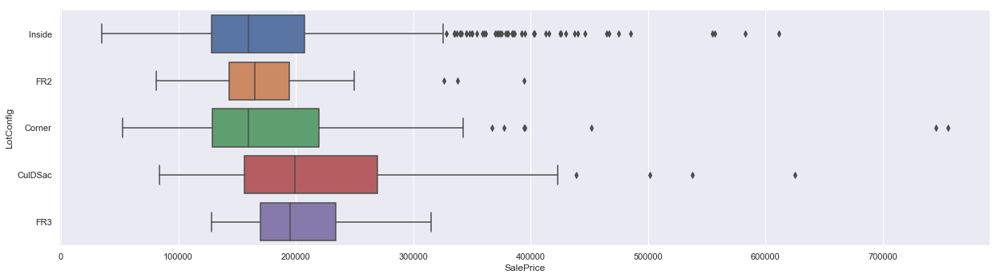

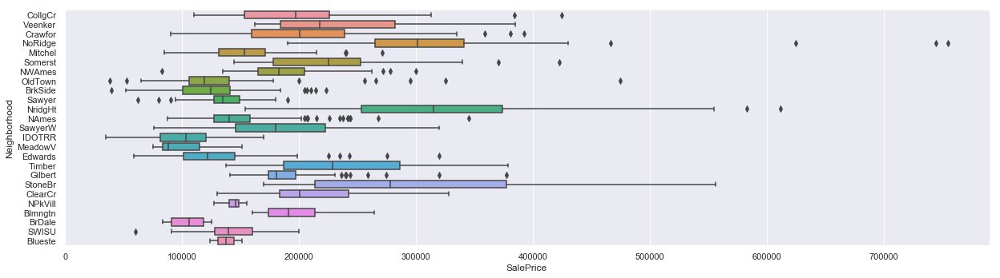

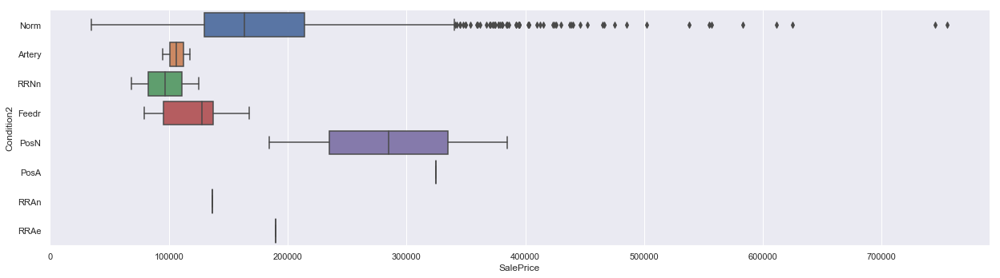

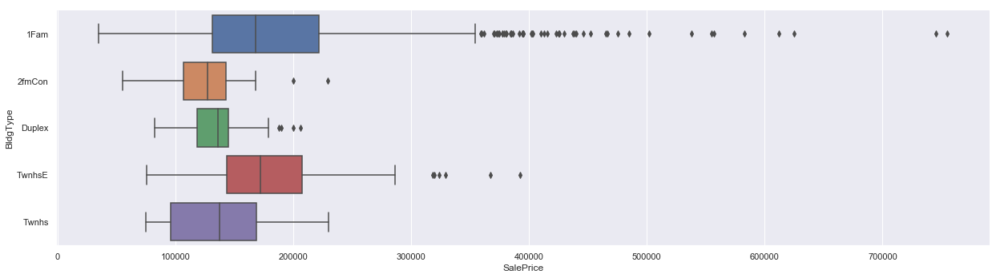

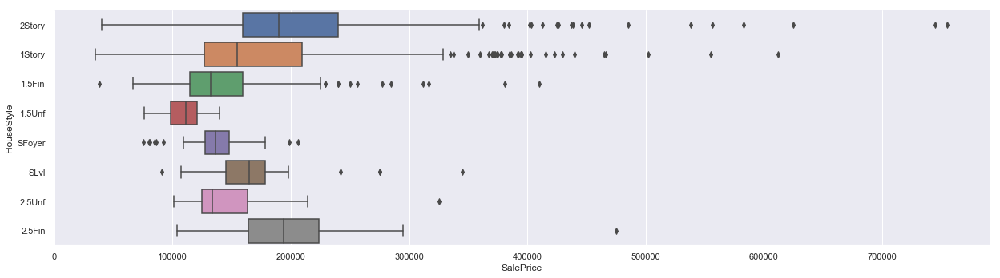

...

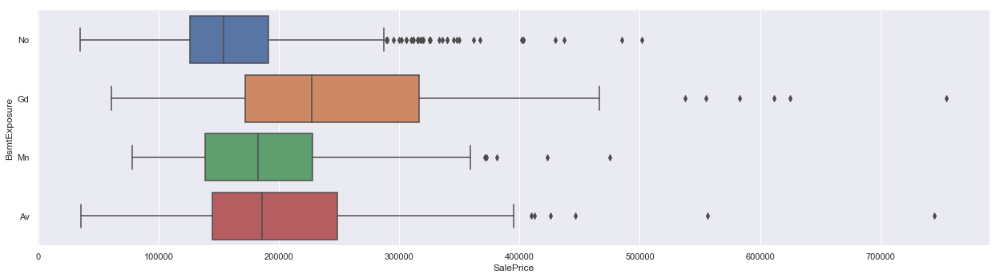

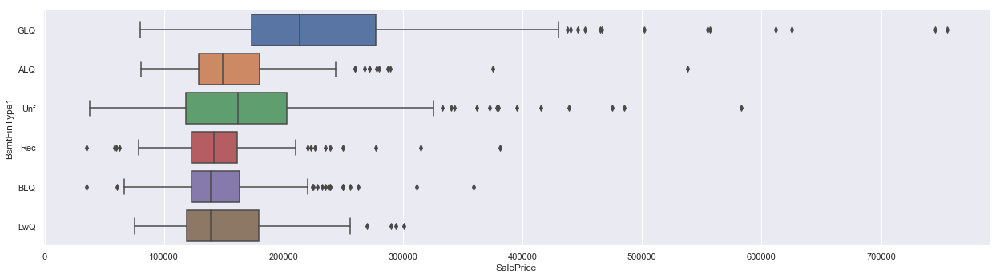

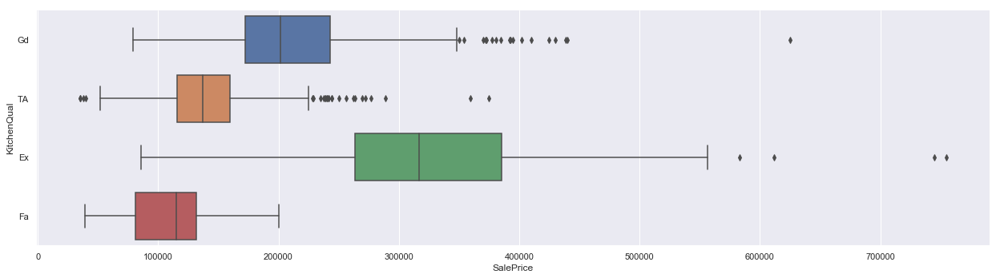

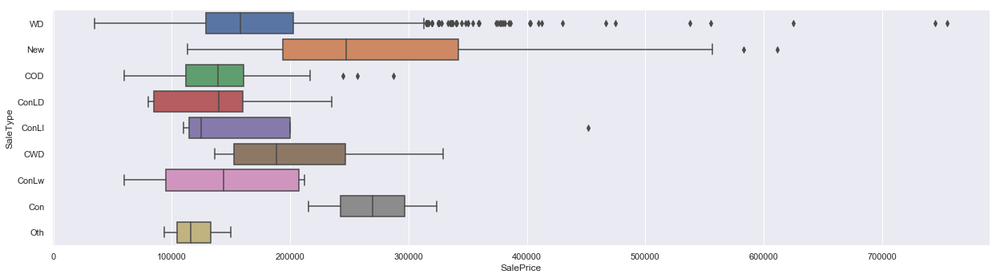

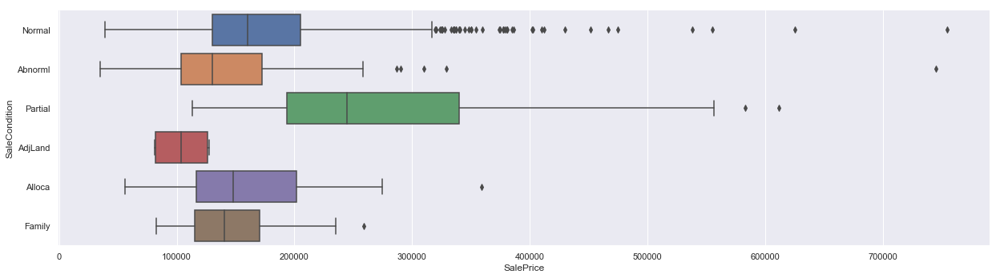

In [285]:
# Iterate through the significant categorical variables:

n=len(anova2_significant)
i=0

for i in range(n):
    # Draw the boxplot
    ax[i] = sns.catplot(x="SalePrice",y=anova2_significant[i], kind='box',data=train2, aspect=7/2)
              
    i+=1


### For curiosity, let's plot non significant and non redundant in information variables with SalePrice

ValueError: Could not interpret input 'Residual'

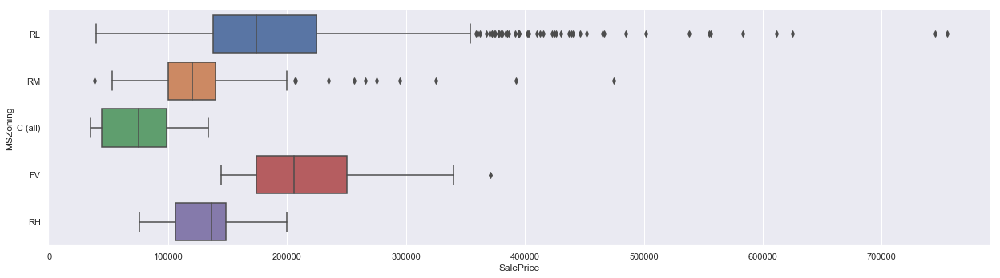

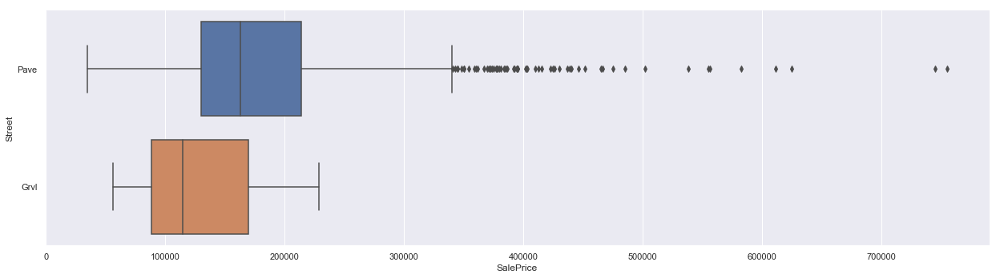

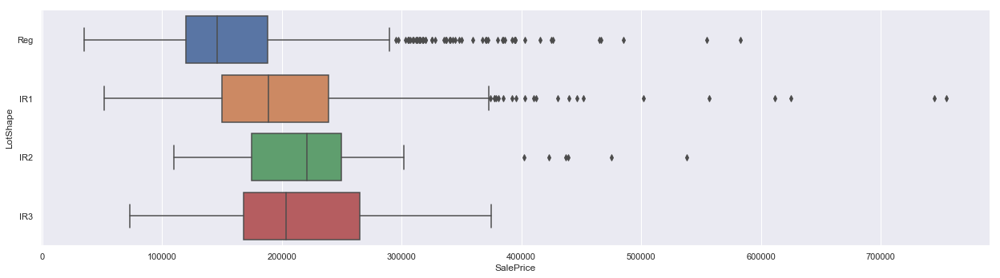

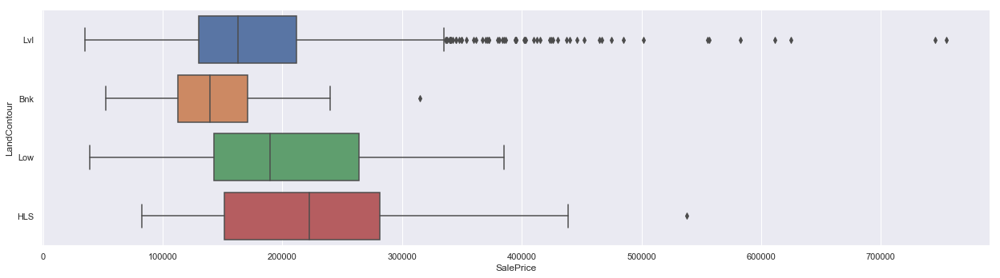

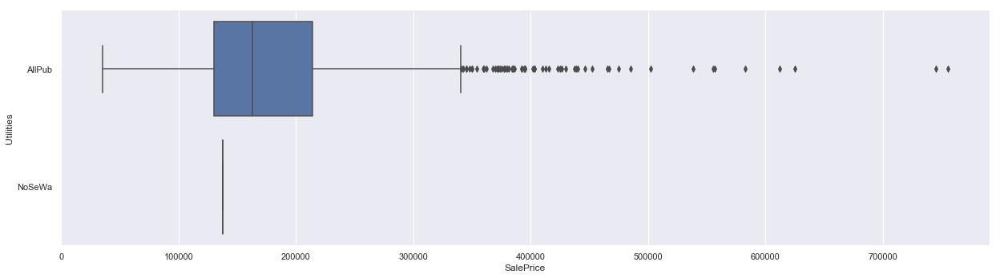

...

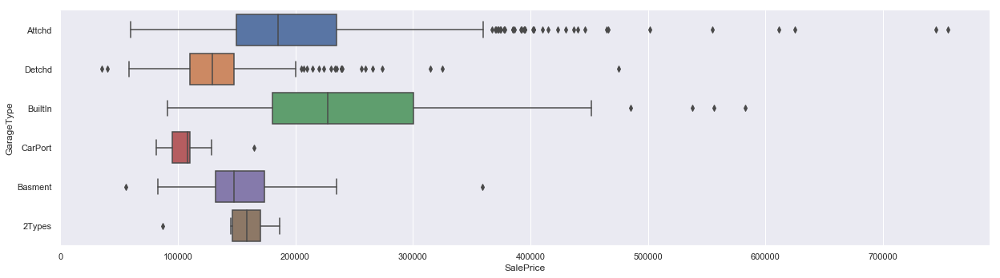

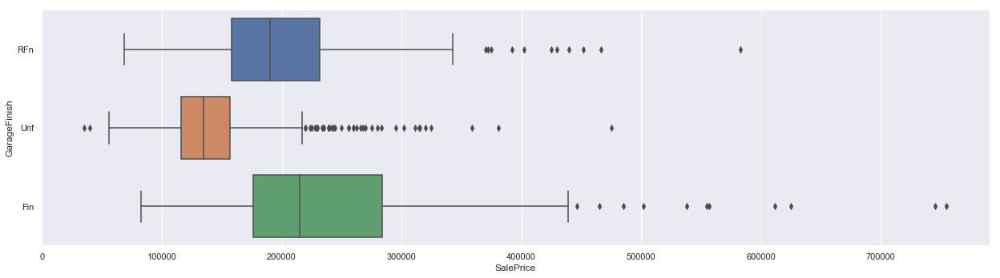

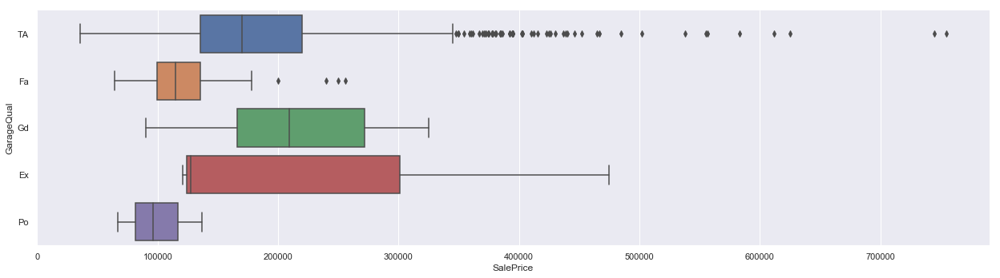

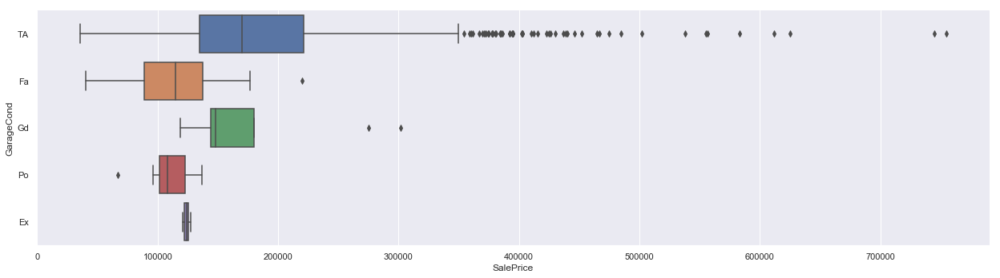

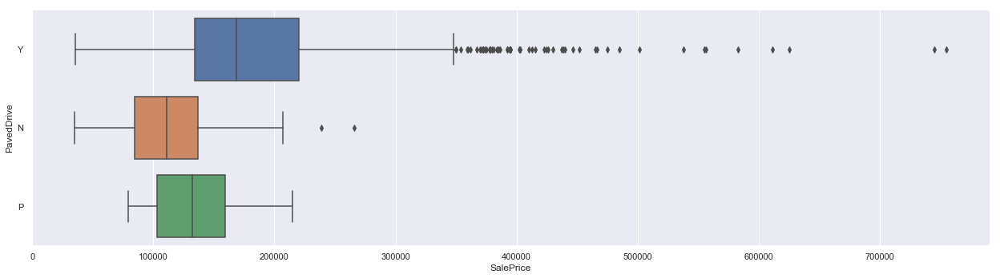

In [284]:
# Iterate through the NON significant categorical variables:

n=len(anova2_not_significant)
i=0

for i in range(n+1):
    # Draw the boxplot
    ax[i] = sns.catplot(x="SalePrice",y=anova2_not_significant[i], kind='box',data=train2, aspect=7/2)
              
    i+=1


## Numeric columns

In [288]:
col_num = train.select_dtypes(include=['int', 'float']).columns
col_num

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

### Subsetting data to numeric variables

### Correlation matrices

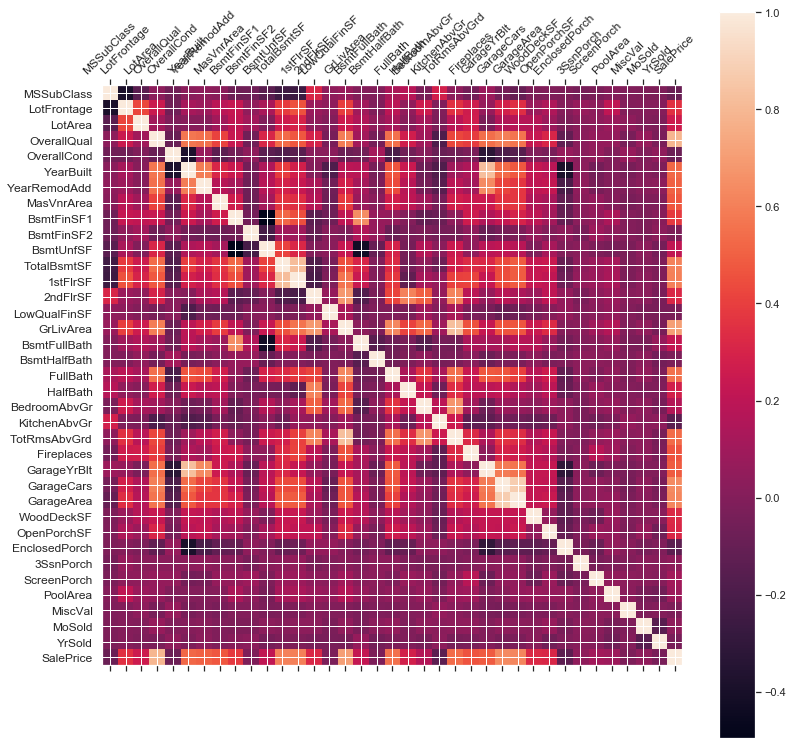

In [320]:

train3 = train2[[col for col in col_num[1:]]]  # ignoring Id column as a variable

f = plt.figure(figsize=(13, 13))
plt.matshow(train3.corr(), fignum=f.number)
plt.xticks(range(train3.shape[1]), train3.columns, fontsize=12, rotation=45)
plt.yticks(range(train3.shape[1]), train3.columns, fontsize=12)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=11)
#plt.title('Correlation Matrix', fontsize=16);
plt.show()

From this figure, 'OverallQual' looks like showing high correlation with SalePrice, as well as 'GrLivArea'.

In [379]:
# Create correlation matrix

corr_matrix = train3.corr().abs()
corr_matrix.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,0.386347,0.139781,0.032628,0.059316,0.027850,0.040581,0.022936,0.069836,0.065649,...,0.012579,0.006100,0.012037,0.043825,0.026030,0.008283,0.007683,0.013585,0.021407,0.084284
LotFrontage,0.386347,1.000000,0.426095,0.251646,0.059213,0.123349,0.088866,0.193458,0.233633,0.049900,...,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
LotArea,0.139781,0.426095,1.000000,0.105806,0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,...,0.171698,0.084774,0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,0.014261,0.263843
OverallQual,0.032628,0.251646,0.105806,1.000000,0.091932,0.572323,0.550684,0.411876,0.239666,0.059119,...,0.238923,0.308819,0.113937,0.030371,0.064886,0.065166,0.031406,0.070815,0.027347,0.790982
OverallCond,0.059316,0.059213,0.005636,0.091932,1.000000,0.375983,0.073741,0.128101,0.046231,0.040229,...,0.003334,0.032589,0.070356,0.025504,0.054811,0.001985,0.068777,0.003511,0.043950,0.077856


In [417]:

# adding index as a column

corr_matrix['variable'] = corr_matrix.index
corr_matrix.head(15)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,variable
MSSubClass,1.000000,0.386347,0.139781,0.032628,0.059316,0.027850,0.040581,0.022936,0.069836,0.065649,...,0.006100,0.012037,0.043825,0.026030,0.008283,0.007683,0.013585,0.021407,0.084284,MSSubClass
LotFrontage,0.386347,1.000000,0.426095,0.251646,0.059213,0.123349,0.088866,0.193458,0.233633,0.049900,...,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799,LotFrontage
LotArea,0.139781,0.426095,1.000000,0.105806,0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,...,0.084774,0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,0.014261,0.263843,LotArea
OverallQual,0.032628,0.251646,0.105806,1.000000,0.091932,0.572323,0.550684,0.411876,0.239666,0.059119,...,0.308819,0.113937,0.030371,0.064886,0.065166,0.031406,0.070815,0.027347,0.790982,OverallQual
OverallCond,0.059316,0.059213,0.005636,0.091932,1.000000,0.375983,0.073741,0.128101,0.046231,0.040229,...,0.032589,0.070356,0.025504,0.054811,0.001985,0.068777,0.003511,0.043950,0.077856,OverallCond
YearBuilt,0.027850,0.123349,0.014228,0.572323,0.375983,1.000000,0.592855,0.315707,0.249503,0.049107,...,0.188686,0.387268,0.031355,0.050364,0.004950,0.034383,0.012398,0.013618,0.522897,YearBuilt
YearRemodAdd,0.040581,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,0.067759,...,0.226298,0.193919,0.045286,0.038740,0.005829,0.010286,0.021490,0.035743,0.507101,YearRemodAdd
MasVnrArea,0.022936,0.193458,0.104160,0.411876,0.128101,0.315707,0.179618,1.000000,0.264736,0.072319,...,0.125703,0.110204,0.018796,0.061466,0.011723,0.029815,0.005965,0.008201,0.477493,MasVnrArea
BsmtFinSF1,0.069836,0.233633,0.214103,0.239666,0.046231,0.249503,0.128451,0.264736,1.000000,0.050117,...,0.111761,0.102303,0.026451,0.062021,0.140491,0.003571,0.015727,0.014359,0.386420,BsmtFinSF1
BsmtFinSF2,0.065649,0.049900,0.111170,0.059119,0.040229,0.049107,0.067759,0.072319,0.050117,1.000000,...,0.003093,0.036543,0.029993,0.088871,0.041709,0.004940,0.015211,0.031706,0.011378,BsmtFinSF2


### Plotting correlation values between SalePrice and all other numerical variables

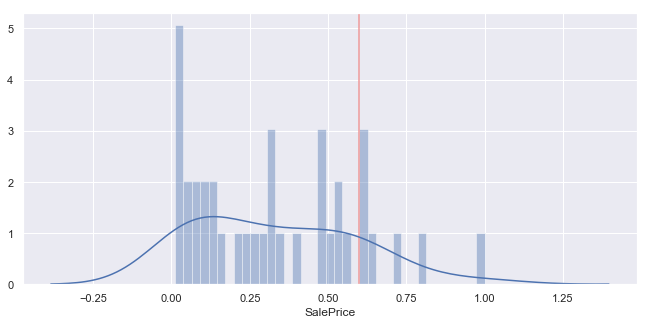

In [361]:
p2 = plt.axvline(x =0.6,color='#EF9A9A')

sns.distplot(corr_matrix['SalePrice'], bins=len(corr_matrix))


Correlation threshold at 0.60: all features with correlation < 0.60 will be ignored

### Find features with correlation greater than 0.60


In [382]:

corr_significant=[]
for index, row in corr_matrix.iterrows():
    if (row['SalePrice'] >= 0.6):
        corr_significant.append(row['variable'])

corr_significant

['OverallQual',
 'TotalBsmtSF',
 '1stFlrSF',
 'GrLivArea',
 'GarageCars',
 'GarageArea',
 'SalePrice']

### Plotting significant numerical variables with SalePrice

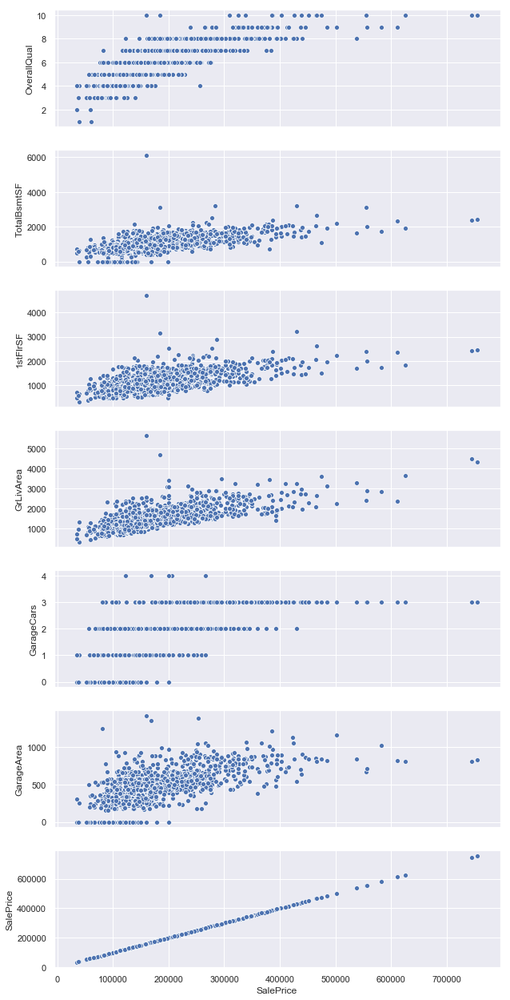

In [411]:
newtrain_significant = train3[[col for col in corr_significant]]
n=len(newtrain_significant.columns)
fig,ax = plt.subplots(n,1, figsize=(10,22), sharex=True)
i=0
for i in range(n):
    plt.sca(ax[i])
    col = newtrain_significant.columns[i]
    sns.scatterplot(x="SalePrice", y=col, data=newtrain_significant)    
    i=+1


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1c33d84ac8>,
      dtype=object)

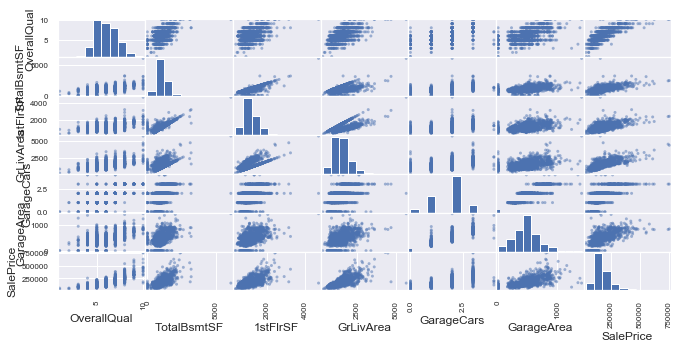

In [424]:
pd.plotting.scatter_matrix(newtrain_significant)


### Linear regression between all numerical variables and SalePrice

In [412]:

X = sm.add_constant(train3[[col for col in corr_significant if col != 'SalePrice']]) # adding a constant
Y = train3['SalePrice']

model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 

print_model = model.summary()
print(print_model)


                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.762
Model:                            OLS   Adj. R-squared:                  0.761
Method:                 Least Squares   F-statistic:                     775.0
Date:                Sat, 21 Sep 2019   Prob (F-statistic):               0.00
Time:                        17:36:25   Log-Likelihood:                -17496.
No. Observations:                1460   AIC:                         3.501e+04
Df Residuals:                    1453   BIC:                         3.504e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -1.027e+05   4903.994    -20.932      

#### Looks like "GarageArea" doesn't explain much SalePrice after all, when applying LR on all variables (pvalue=0.135)

R2 = 0.762
P <<< 0

Durbin-Watson:                   1.976  >> homoscedasticity

Cond. No.                     1.14e+04   >> no multicollinearity

#### Numerical variables that significantly influence SalePrice : 'OverallQual', 'TotalBsmtSF', '1stFlrSF','GrLivArea','GarageCars'

In [429]:
#pip install pandas-profiling
import pandas_profiling

train.profile_report(style={'full_width':True})
